In [1]:
from pathlib import Path
from recursive_partitioning import *
from molecule_visualization_utils import *
import networkx as nx
import random
import time

MOLFILEPATH = "../test/testfiles"

# Canonicalization

## Molecule partitioning
The goal is to divide atoms in equivalence-classes / partitions.

First, sort the atoms by a fingerprint that consists of the atomic number and the atom's ring neighbors (elaborate).

original
╒═════════╤═══════════════╤═════════════╤═════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint   │   partition │ neighbors (index, fingerprint, partition)                           │
╞═════════╪═══════════════╪═════════════╪═════════════════════════════════════════════════════════════════════╡
│       0 │ 6543210-1     │           0 │ [(1, '6543210-1', 0), (5, '6543210-1', 0), (11, '1-1', 0)]          │
├─────────┼───────────────┼─────────────┼─────────────────────────────────────────────────────────────────────┤
│       1 │ 6543210-1     │           0 │ [(0, '6543210-1', 0), (2, '6543210-1', 0), (12, '1-1', 0)]          │
├─────────┼───────────────┼─────────────┼─────────────────────────────────────────────────────────────────────┤
│       2 │ 6543210-1     │           0 │ [(1, '6543210-1', 0), (3, '69876543210-1', 0), (13, '1-1', 0)]      │
├─────────┼───────────────┼─────────────┼──────────────────────────────────────────────────────

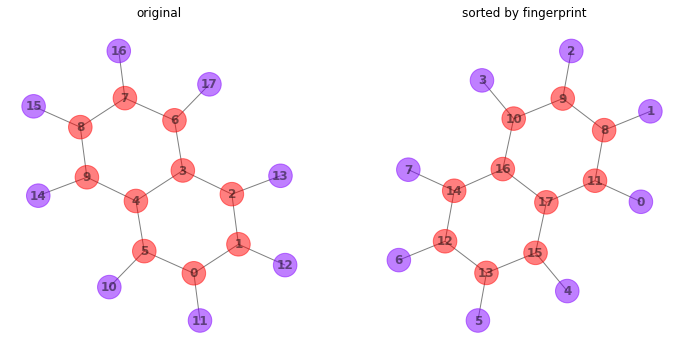

In [2]:
molecule = "naphthalene"
m = graph_from_molfile(f"{MOLFILEPATH}/{molecule}/{molecule}.mol")
m_sorted_by_fingerprint = sort_molecule_by_attribute(m, "fingerprint")
print_molecule(m, "original")
print_molecule(m_sorted_by_fingerprint, "sorted by fingerprint")
draw_molecules([m, m_sorted_by_fingerprint], ["original", "sorted by fingerprint"], highlight="atomic_number")

Subsequently, the molecule is partitioned by fingerprint.


╒═════════╤═══════════════╤═════════════╤════════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint   │   partition │ neighbors (index, fingerprint, partition)                              │
╞═════════╪═══════════════╪═════════════╪════════════════════════════════════════════════════════════════════════╡
│       0 │ 1-1           │           0 │ [(11, '6543210-1', 3)]                                                 │
├─────────┼───────────────┼─────────────┼────────────────────────────────────────────────────────────────────────┤
│       1 │ 1-1           │           0 │ [(8, '6543210-1', 2)]                                                  │
├─────────┼───────────────┼─────────────┼────────────────────────────────────────────────────────────────────────┤
│       2 │ 1-1           │           0 │ [(9, '6543210-1', 2)]                                                  │
├─────────┼───────────────┼─────────────┼──────────────────────────────────────

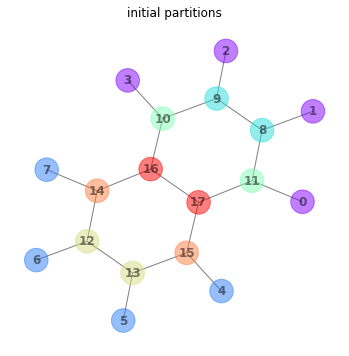

In [3]:
m_partitioned_by_fingerprint = partition_molecule_by_attribute(m_sorted_by_fingerprint, "fingerprint")
print_molecule(m_partitioned_by_fingerprint)
draw_molecules([m_partitioned_by_fingerprint], ["initial partitions"], highlight="partition")

Now, we refine the partitions recursively ("partitioning by partition"): elaborate.

refined partitions
╒═════════╤═══════════════╤═════════════╤════════════════════════════════════════════════════════════════════════╕
│   index │ fingerprint   │   partition │ neighbors (index, fingerprint, partition)                              │
╞═════════╪═══════════════╪═════════════╪════════════════════════════════════════════════════════════════════════╡
│       0 │ 1-1           │           0 │ [(8, '6543210-1', 2)]                                                  │
├─────────┼───────────────┼─────────────┼────────────────────────────────────────────────────────────────────────┤
│       1 │ 1-1           │           0 │ [(9, '6543210-1', 2)]                                                  │
├─────────┼───────────────┼─────────────┼────────────────────────────────────────────────────────────────────────┤
│       2 │ 1-1           │           0 │ [(11, '6543210-1', 3)]                                                 │
├─────────┼───────────────┼─────────────┼────────────────────

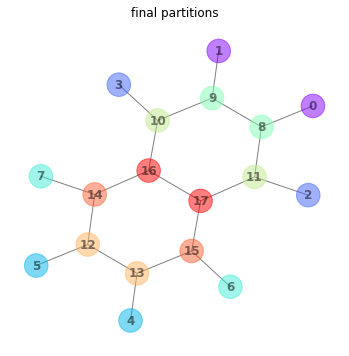

In [4]:
m_partitioned = partition_molecule_recursively(m_partitioned_by_fingerprint, show_steps=True)
draw_molecules([m_partitioned], ["final partitions"], highlight="partition")

After the recursive refinement of the partitions, many partitions contain only a few molecules. This brings us closer to the ultimate goal of the canonicalization. That is, we are closer to shattering the molecule such that each atom resides in a unique partition. How do we shatter the molecule?

## Molecule traversal

Traversing molecule deterministically by branching in a principled way based on partitions.
I.e., establish branching-priorities for situations when traversal can branch to multiple neighbors from atom A:
1. neighbor with larger partition than A
2. neighbor with smaller partition than A
3. neighbor in same partition as A

During traversal, swap indices such that the current molecule A from partition P gets assigned the smallest-available index that remains in partition P (elaborate).

Current atom index: 0.	Re-labeling to 0.
Current atom index: 8.	Re-labeling to 8.
Current atom index: 11.	Re-labeling to 10.
Current atom index: 9.	Re-labeling to 9.
Current atom index: 17.	Re-labeling to 16.
Current atom index: 2.	Re-labeling to 2.
Current atom index: 10.	Re-labeling to 11.
Current atom index: 1.	Re-labeling to 1.
Current atom index: 15.	Re-labeling to 14.
Current atom index: 16.	Re-labeling to 17.
Current atom index: 3.	Re-labeling to 3.
Current atom index: 6.	Re-labeling to 6.
Current atom index: 13.	Re-labeling to 12.
Current atom index: 14.	Re-labeling to 15.
Current atom index: 4.	Re-labeling to 4.
Current atom index: 12.	Re-labeling to 13.
Current atom index: 7.	Re-labeling to 7.
Current atom index: 5.	Re-labeling to 5.


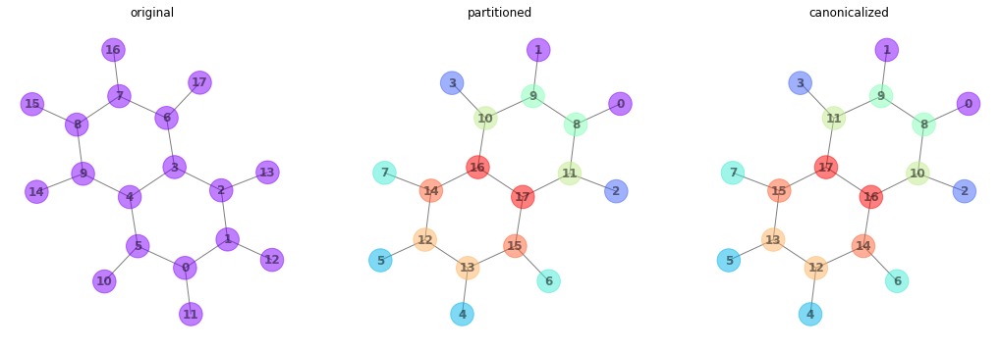

In [5]:
canonical_idcs = traverse_molecule(m_partitioned, 0, show_traversal_order=True)
m_canonicalized = nx.relabel_nodes(m_partitioned, canonical_idcs, copy=True)

draw_molecules([m, m_partitioned, m_canonicalized], ["original", "partitioned", "canonicalized"], highlight="partition")

# Invariance Test
In order to be useful for the identification of a molecule, the canonicalization must be invariant. That is, irrespective of a molecule's initial atom labels, the canonicalization should always result in the same string representation. Below we set up a simple test of invariance. 

In [6]:
testfiles = list(Path(MOLFILEPATH).glob("*/*.mol"))
failed_molecules = {}

for test_run in range(10):
    
    for molfile in testfiles:
        m = graph_from_molfile(molfile)
        permutation_seed = int(time.time())
        m_permu = permute_molecule(m, random_seed=permutation_seed)
        
        if m.number_of_edges() > 1 and nx.density(m) != 1:    # only enforce permutation for graphs with at least 2 edges that aren't fully connected (i.e., complete)
            while m.edges == m_permu.edges:
                permutation_seed = int(time.time())
                m_permu = permute_molecule(m, random_seed=permutation_seed)
            assert m.edges != m_permu.edges, f"Permutation didn't change labeling of {molfile.stem}."
            
        random.seed()
        root_atom = random.choice(range(m.number_of_nodes()))
        m_canon = canonicalize_molecule(m, root_atom)
        m_permu_canon = canonicalize_molecule(m_permu, root_atom)
        
        if m_canon.edges != m_permu_canon.edges:
            print(f"Canonicalization resulted in different labelings for {molfile.stem}.")
            if molfile.stem in failed_molecules:
                failed_molecules[molfile.stem][root_atom] = permutation_seed    # only retain latest permutation seed
            else:
                failed_molecules[molfile.stem] = {root_atom: permutation_seed}
                
print(f"\n{len(failed_molecules)}/{len(testfiles)} failed invariance tests over {test_run + 1} test runs.")

for molecule, test_config in failed_molecules.items():

    root_atom, permutation_seed = list(test_config.items())[0]

    m = graph_from_molfile(f"{MOLFILEPATH}/{molecule}/{molecule}.mol")
    m_permu = permute_molecule(m, permutation_seed)
    
    m_canon = canonicalize_molecule(m, root_idx=root_atom)
    m_permu_canon = canonicalize_molecule(m_permu, root_idx=root_atom)

    draw_molecules([m_canon, m_permu_canon], ["original","permuted"], highlight="partition",
                    title=f"{molecule} canonicalized\n(root atom: {root_atom}, permutation seed: {permutation_seed})")


0/84 failed invariance tests over 10 test runs.


/workspaces/nInChI_prototype/notebooks/molecule_visualization_utils.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(n_molecules * 6, 6))


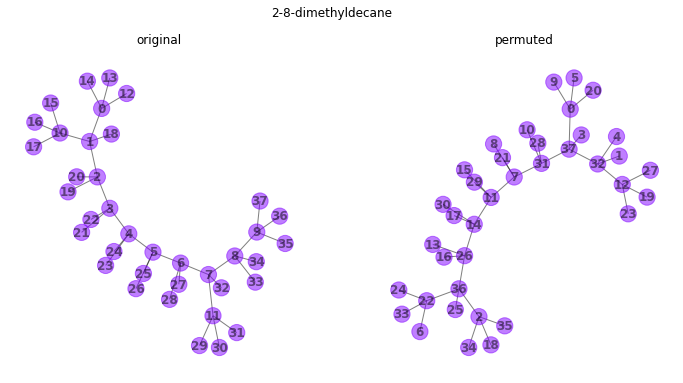

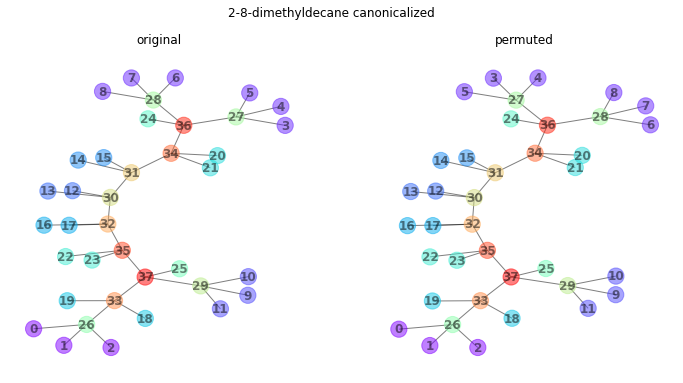

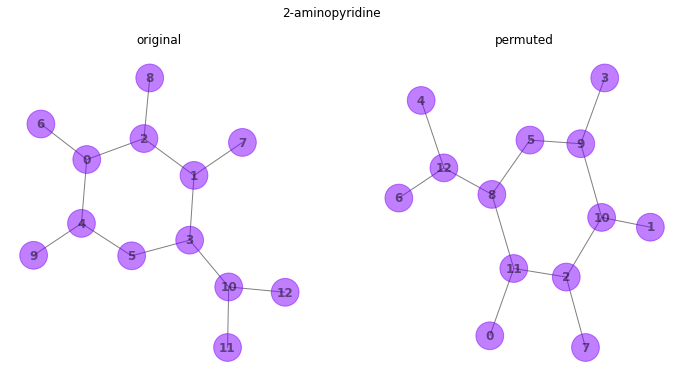

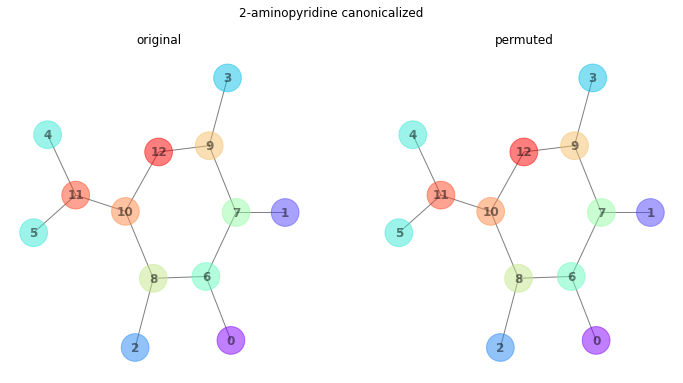

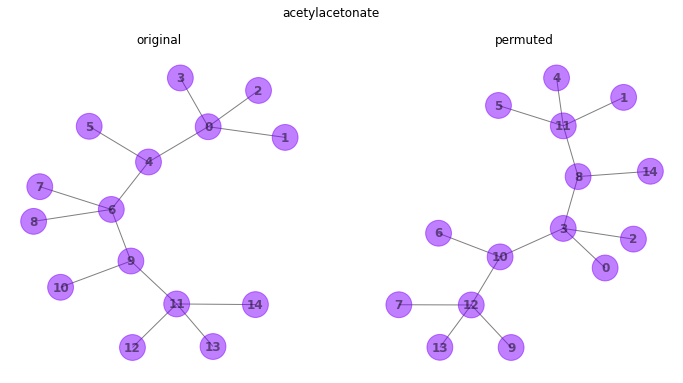

...

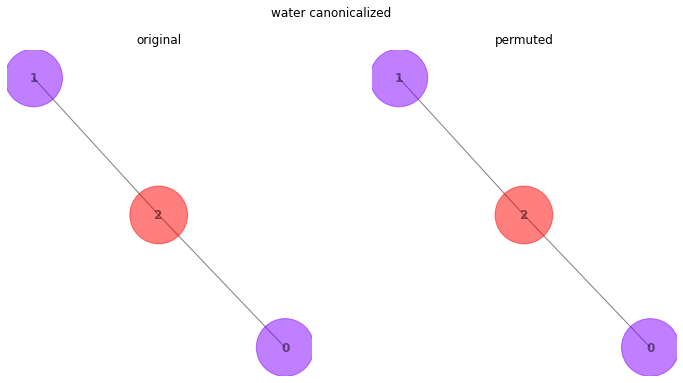

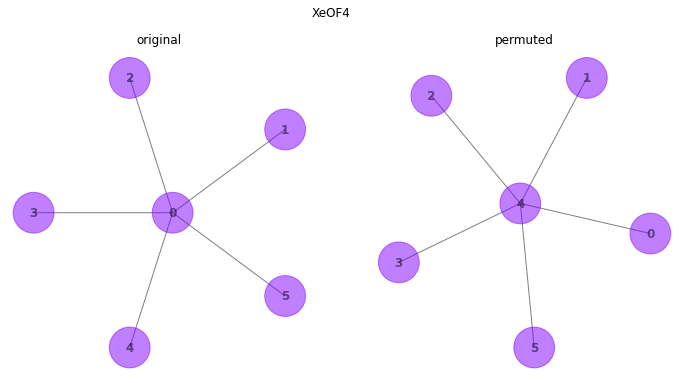

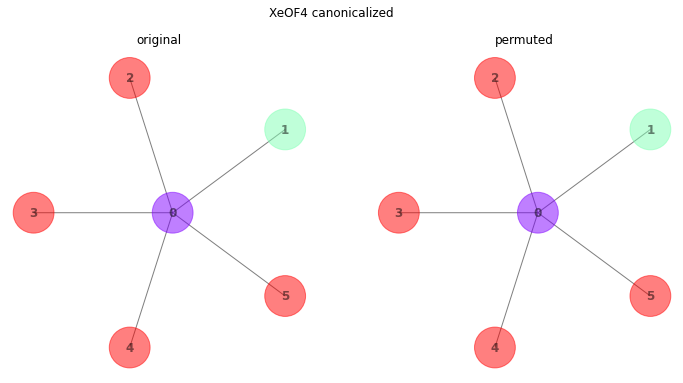

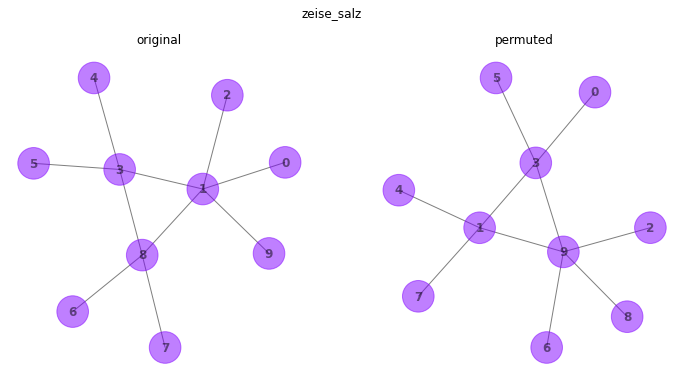

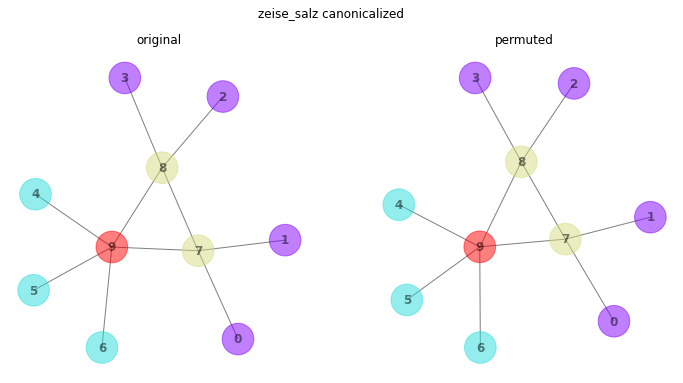

In [7]:
testfiles = list(Path(MOLFILEPATH).glob("*/*.mol"))

for molfile in testfiles:
    m = graph_from_molfile(molfile)
    m_permu = permute_molecule(m)
    draw_molecules([m, m_permu], ["original", "permuted"], highlight="partition", title=f"{molfile.stem}")

    m_canon = canonicalize_molecule(m, 0)
    m_permu_canon = canonicalize_molecule(m_permu, 0)
    
    draw_molecules([m_canon, m_permu_canon], ["original", "permuted"], highlight="partition", title=f"{molfile.stem} canonicalized")